In [14]:
# %matplotlib widget


In [15]:
import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
# import proplot as pplt
import matplotlib.gridspec as gridspec
import seaborn as sns
import pandas as pd
from matplotlib.ticker import FuncFormatter, MultipleLocator, LogLocator
import matplotlib.colors as colors
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [16]:
sns.set_context("paper",font_scale=2.)
import matplotlib.colors as colors
import matplotlib.cbook as cbook
class MidpointNormalize(colors.Normalize):
    def __init__(self, vmin=None, vmax=None, vcenter=None, clip=False):
        self.vcenter = vcenter
        colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        # I'm ignoring masked values and all kinds of edge cases to make a
        # simple example...
        x, y = [self.vmin, self.vcenter, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))
midnorm = lambda LE1,LE2,vcenter=0.001: MidpointNormalize(vmin=np.min(LE2), vcenter=vcenter, vmax=np.max(LE1))

In [19]:
cmap = sns.diverging_palette(220, 20, sep=20, as_cmap=True)
cmap = sns.cm.vlag
# cmap = sns.diverging_palette(20, 220, sep=20, as_cmap=True)
# cmap = sns.cm.rocket
txt_size = 30
ttl_size = 48
lw = 5
params = {'figure.figsize': (15, 5),
         'axes.titlesize':40,
         'xtick.labelsize':txt_size,
         'ytick.labelsize': txt_size,
        'axes.labelsize': txt_size}
#           'legend.fontsize': 'x-large',
plt.rcParams.update(params)

In [20]:
minf = lambda arr: np.ma.array(arr, mask = np.isinf(arr))

In [21]:
tmp = np.load('LE_rnn_tanh.npz')
td = tmp['thetas']
ad = tmp['alphas']
le1d = minf(tmp['LE1'].reshape(len(td),len(ad)))
le2d = minf(tmp['LE2'].reshape(len(td),len(ad)))

tmp = np.load('frequency_rnn_tanh.npz')
td2 = tmp['thetas_tanh']
ad2 = tmp['rad_tanh']
omegad = tmp['frequencies_tanh'].reshape(len(td2),len(ad2))
omegad = 1./np.ma.array(omegad, mask = omegad==0) # convert to frequencies rather than period

In [22]:
td2.shape

(100,)

In [23]:
tmp = np.load('LE_ode_tanh.npz')
tc = tmp['thetas']
ac = tmp['alpha']
le1c = minf(tmp['LE1'].reshape(len(tc),len(ac))).T
le2c = minf(tmp['LE2'].reshape(len(tc),len(ac))).T

tmp = np.load('frequency_ode_tanh.npz')
tc2 = tmp['thetas_tanh']
ac2 = tmp['rad_tanh']
omegac = tmp['frequencies_tanh'].reshape(len(ac2),len(tc2))
omegac = 1./np.ma.array(omegac, mask = omegac==0) # convert to frequencies rather than period

In [43]:
f = np.load("bifcurve.npz")
bifa = f['alpha'].squeeze()
bift = f['theta'].squeeze()

In [24]:
def do_magic_on_axes(ax):
    ax[0].get_shared_x_axes().join(ax[0], ax[1])
    ax[0].get_shared_x_axes().join(ax[0], ax[2])

    ax[0].get_shared_y_axes().join(ax[0], ax[1])
    ax[0].get_shared_y_axes().join(ax[0], ax[2])
    for i in range(3):
        ax[i].set_yticklabels([])
        ax[i].set_ylim([0.,10.])
        ax[i].yaxis.set_major_formatter(FuncFormatter(
    lambda val,pos: '{:.2g}'.format(val)))
        ax[i].yaxis.set_major_locator(MultipleLocator(base=1.))
        if i>0:
            ax[i].yaxis.set_ticklabels([])
    #     ax[i].set_aspect(np.pi/10)
    for i in range(4):
        ax[i].xaxis.set_major_formatter(FuncFormatter(
    lambda val,pos: '{:.2g}$\pi$'.format(val/np.pi) if val !=0 and val/np.pi!=1. else ('0' if val==0  else '$\pi$')))
        ax[i].xaxis.set_major_locator(MultipleLocator(base=0.25*np.pi))



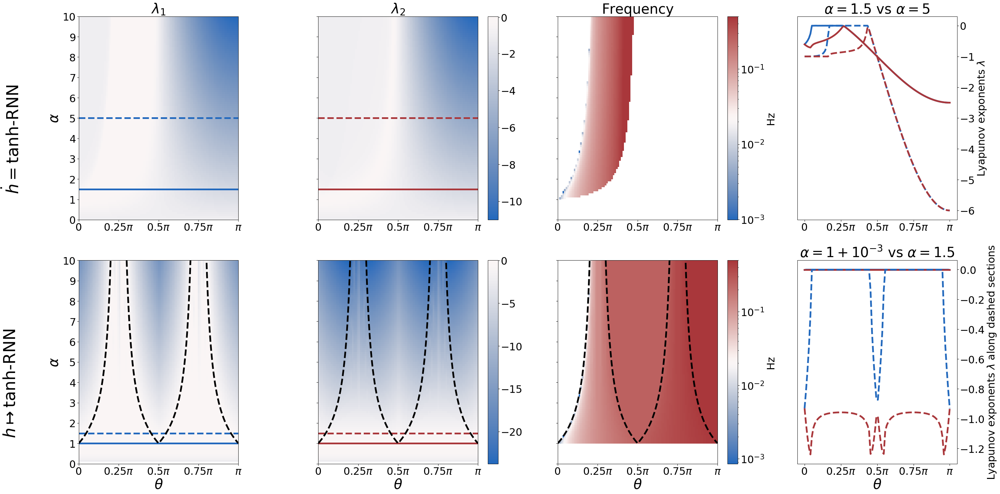

In [49]:
ncols = 4
nrows = 2
width = 12
fig = plt.figure(figsize=(ncols*width,nrows*width))
gs0 = gridspec.GridSpec(2, 4)
gs01 = gridspec.GridSpecFromSubplotSpec(4,1, subplot_spec=gs0[3],hspace=0.0)

# fig, axs = plt.subplots(nrows=2,ncols=ncols,figsize=(ncols*width,nrows*width))
axs = [fig.add_subplot(gs0[i]) for i in range(nrows*ncols)]
# subaxs = [fig.add_subplot(gs01[i]) for i in range(4)]




f1 = axs[0].pcolor(tc,ac,le1c,cmap=cmap, norm=midnorm(le1c,le2c,vcenter=0.02))
axs[0].set_title(r'$\lambda_{1}$')
cbar = fig.colorbar(f1, ax=axs[0], orientation='vertical')
cbar.remove()
f2 =axs[1].pcolor(tc,ac,le2c,cmap=cmap, norm=midnorm(le1c,le2c,vcenter=0.02))
axs[1].set_title(r'$\lambda_{2}$')
fig.colorbar(f2, ax=axs[1], orientation='vertical')

f3 = axs[2].pcolor(tc2,ac2,omegac ,cmap=cmap,
                      norm=colors.LogNorm(vmin=omegac.min(), vmax=0.5))

axs[2].set_title(r'Frequency')
fig.colorbar(f3, ax=axs[2], orientation='vertical',label="Hz")



idx_approx1 = np.where(ac==1.5)[0][0]
idx_15 = np.where(ac==5.)[0][0]
left = cmap(0)
right = cmap(cmap.N)
colorL1 =left
colorL2 = right
axs[0].plot(tc, np.ones_like(tc)*ac[idx_approx1], linestyle="solid", color=colorL1,linewidth=lw)
axs[1].plot(tc, np.ones_like(tc)*ac[idx_approx1], linestyle="solid", color=colorL2,linewidth=lw)
axs[0].plot(tc, np.ones_like(tc)*5., linestyle="dashed", color=colorL1,linewidth=lw)
axs[1].plot(tc, np.ones_like(tc)*5., linestyle="dashed", color=colorL2,linewidth=lw)

axs[3].plot(tc,le1c[idx_approx1,:], label=r'$\lambda_{1},\, \alpha = 1+10^{-3}$', color=colorL1,linewidth=lw)
axs[3].plot(tc,le2c[idx_approx1,:], label=r'$\lambda_{2},\, \alpha = 1+10^{-3}$', color=colorL2, linewidth=lw)

axs[3].plot(tc,le1c[idx_15,:],label=r'$\lambda_{1},\, \alpha = 5.$', linestyle="dashed", color=colorL1, linewidth=lw)
f4 = axs[3].plot(tc,le2c[idx_15,:],label=r'$\lambda_{2},\, \alpha = 5.$', linestyle="dashed", color=colorL2, linewidth=lw)
axs[3].set_title(r"$\alpha = 1.5$ vs $\alpha = 5$")
cbar = fig.colorbar(f2, ax=axs[3], orientation='vertical')
cbar.remove()
axs[3].yaxis.tick_right()
axs[3].yaxis.set_label_position("right")
axs[3].set_ylabel(r"Lyapunov exponents $\lambda$")
do_magic_on_axes(axs[0:])




ds = 4

f1 = axs[ds+0].pcolor(td,ad,le1d.T,cmap=cmap, norm=midnorm(le1d,le2d,vcenter=0.01))
# axs[ds+0].set_title(r'$\lambda_{1}$')
cbar = fig.colorbar(f1, ax=axs[ds+0], orientation='vertical')
cbar.remove()
f2 =axs[ds+1].pcolor(td,ad,le2d.T,cmap=cmap, norm=midnorm(le1d,le2d,vcenter=0.01))
# axs[ds+1].set_title(r'$\lambda_{2}$')
fig.colorbar(f2, ax=axs[ds+1], orientation='vertical')

f3 = axs[ds+2].pcolor(td2,ad2,omegad.T,cmap=cmap,
                 norm=colors.LogNorm(vmin=omegad.min(), vmax=0.5))

# axs[ds+2].set_title(r'Frequency')
fig.colorbar(f3, ax=axs[ds+2], orientation='vertical',label="Hz")

do_magic_on_axes(axs[ds:])


idx_approx1 = np.where(ad==1+1e-3)[0][0]
idx_15 = np.where(ad==1.5)[0][0]
left = cmap(0)
right = cmap(cmap.N)
colorL1 =left
colorL2 = right
axs[ds+0].plot(td, np.ones_like(td)*ad[idx_approx1], linestyle="solid", color=colorL1,linewidth=lw)
axs[ds+1].plot(td, np.ones_like(td)*ad[idx_approx1], linestyle="solid", color=colorL2,linewidth=lw)
axs[ds+0].plot(td, np.ones_like(td)*1.5, linestyle="dashed", color=colorL1,linewidth=lw)
axs[ds+1].plot(td, np.ones_like(td)*1.5, linestyle="dashed", color=colorL2,linewidth=lw)


axs[ds+3].plot(td,le1d.T[idx_approx1,:], label=r'$\lambda_{1},\, \alpha = 1+10^{-3}$', color=colorL1,linewidth=lw)
axs[ds+3].plot(td,le2d.T[idx_approx1,:], label=r'$\lambda_{2},\, \alpha = 1+10^{-3}$', color=colorL2, linewidth=lw)

axs[ds+3].plot(td,le1d.T[idx_15,:],label=r'$\lambda_{1},\, \alpha = 1.5$', linestyle="dashed", color=colorL1, linewidth=lw)
f4 = axs[ds+3].plot(td,le2d.T[idx_15,:],label=r'$\lambda_{2},\, \alpha = 1.5$', linestyle="dashed", color=colorL2, linewidth=lw)
axs[ds+3].set_title(r"$\alpha = 1+10^{-3}$ vs $\alpha = 1.5$")
cbar = fig.colorbar(f2, ax=axs[ds+3], orientation='vertical')
cbar.remove()
axs[ds+3].yaxis.tick_right()
axs[ds+3].yaxis.set_label_position("right")
axs[ds+3].set_ylabel(r"Lyapunov exponents $\lambda$ along dashed sections")


loffset = -1.5
hoffset = 4
axs[0].text(loffset,hoffset,r"$\dot{h}=\mathrm{tanh}$-RNN ", size=ttl_size,
                           verticalalignment='center', rotation=90)

axs[4].text(loffset,hoffset,r"$h \mapsto \mathrm{tanh}$-RNN ", size=ttl_size,
                           verticalalignment='center', rotation=90)
axs[0].set_ylabel(r"$\alpha$",fontsize=40)
axs[4].set_ylabel(r"$\alpha$",fontsize=40)

# adding the bifurcation curve
axs[4].plot(bift,bifa, linewidth=lw, linestyle="dashed", color="k")
axs[5].plot(bift,bifa, linewidth=lw, linestyle="dashed", color="k")
axs[6].plot(bift,bifa, linewidth=lw, linestyle="dashed", color="k")

for ax in axs[4:8]:
    ax.set_xlabel(r"$\theta$",fontsize=40)


In [50]:
fig.savefig("Fig2_alt.pdf",dpi=600)